<a href="https://colab.research.google.com/github/KoushikVGitHub/amplify-nextjs-gallery-app/blob/main/Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras
import warnings
from sklearn.metrics import confusion_matrix
from google.colab import drive
warnings.filterwarnings("ignore")
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
train_data_dir = '/content/gdrive/MyDrive/Image_classification/seg_train/seg_train/'
test_data_dir = '/content/gdrive/MyDrive/Image_classification/seg_test/seg_test/'
pred_data_dir = '/content/gdrive/MyDrive/Image_classification/seg_pred/seg_pred/'

In [5]:
#Data Inspection
for folder in os.listdir(train_data_dir):
    folder_path = os.path.join(train_data_dir, folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    print(f'For training data, found {len(files)} files in folder "{folder}"')

For training data, found 1235 files in folder "mountain"
For training data, found 2191 files in folder "buildings"
For training data, found 2281 files in folder "forest"
For training data, found 2404 files in folder "glacier"
For training data, found 2382 files in folder "street"
For training data, found 2274 files in folder "sea"


In [7]:
for folder in os.listdir(test_data_dir):
    folder_path = os.path.join(test_data_dir, folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    print(f'For testdata, found {len(files)} files in folder "{folder}"')

For testdata, found 525 files in folder "mountain"
For testdata, found 510 files in folder "sea"
For testdata, found 501 files in folder "street"
For testdata, found 437 files in folder "buildings"
For testdata, found 474 files in folder "forest"
For testdata, found 553 files in folder "glacier"


In [9]:
files = gb.glob(os.path.join(pred_data_dir, '*.jpg'))
print(f'Found {len(files)} files ')

Found 7301 files 


**DATA INSPECTION**

In [10]:
#Checking size of all images
size=[]
for folder in os.listdir(train_data_dir):
    folder_path = os.path.join(train_data_dir, folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    for file in files:
        image=plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(150, 150, 3)",12727
"(113, 150, 3)",7
"(135, 150, 3)",3
"(111, 150, 3)",3
"(123, 150, 3)",2
"(142, 150, 3)",2
"(144, 150, 3)",2
"(136, 150, 3)",2
"(134, 150, 3)",2
"(108, 150, 3)",2


In [11]:
size=[]
for folder in os.listdir(test_data_dir):
    folder_path = os.path.join(test_data_dir, folder)
    files = gb.glob(os.path.join(folder_path, '*.jpg'))
    for file in files:
        image=plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(150, 150, 3)",2993
"(131, 150, 3)",1
"(81, 150, 3)",1
"(141, 150, 3)",1
"(110, 150, 3)",1
"(76, 150, 3)",1
"(149, 150, 3)",1
"(72, 150, 3)",1


In [12]:
size=[]
files = gb.glob(os.path.join(pred_data_dir, '*.jpg'))
for file in files:
        image=plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(150, 150, 3)",7288
"(374, 500, 3)",1
"(100, 150, 3)",1
"(112, 150, 3)",1
"(126, 150, 3)",1
"(129, 150, 3)",1
"(149, 150, 3)",1
"(143, 150, 3)",1
"(124, 150, 3)",1
"(131, 150, 3)",1


**DATA PREPROCESSING**

In [13]:
s=150 # Standardizing image size

#Mapping Labels to Numeric Codes
code={'buildings':0,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}
def getcode(n):
    for x,y in code.items():
        if n==y:
            return x

Resizing Images and mapping labels to codes

In [14]:
x_train, y_train = [], []
for folder, label in code.items():
    for file in gb.glob(os.path.join(train_data_dir, folder, '*.jpg')):
        image = cv2.imread(file)
        x_train.append(list(cv2.resize(image, (s, s))))
        y_train.append(label)

x_test, y_test = [], []
for folder, label in code.items():
    for file in gb.glob(os.path.join(test_data_dir, folder, '*.jpg')):
        image = cv2.imread(file)
        x_test.append(list(cv2.resize(image, (s, s))))
        y_test.append(label)

x_pred = []
for file in gb.glob(os.path.join(pred_data_dir, '*.jpg')):
    image = cv2.imread(file)
    x_pred.append(list(cv2.resize(image, (s, s))))

Visualise Sample Images

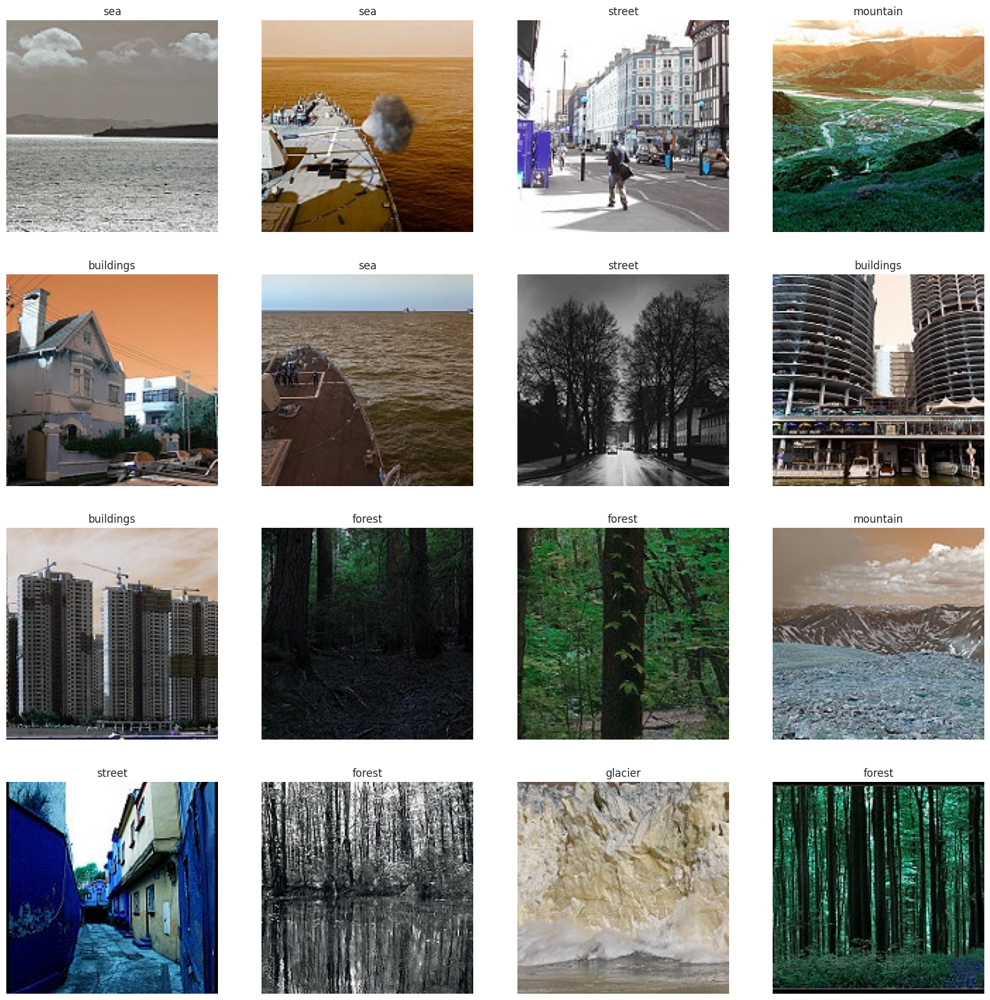

In [25]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(x_train),16))):
    plt.subplot(4,4,n+1)
    plt.imshow(x_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

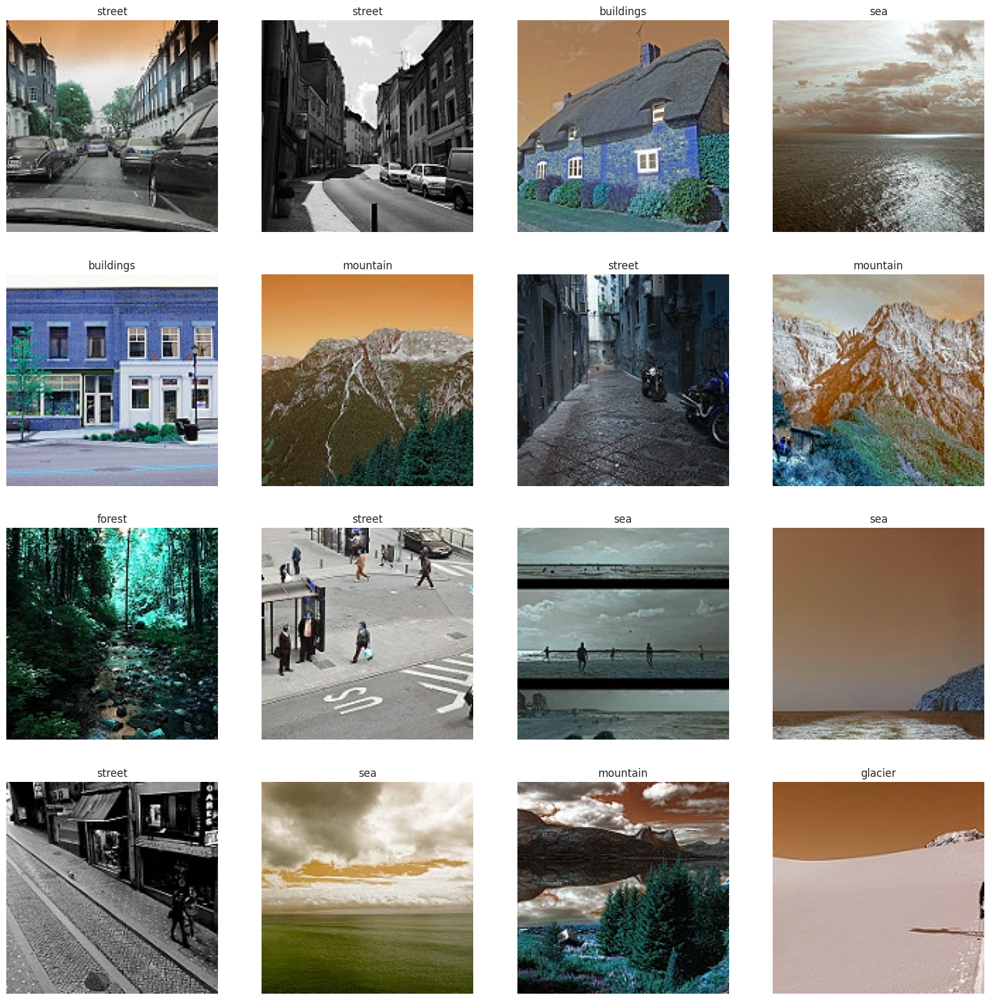

In [26]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(x_test),16))):
    plt.subplot(4,4,n+1)
    plt.imshow(x_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

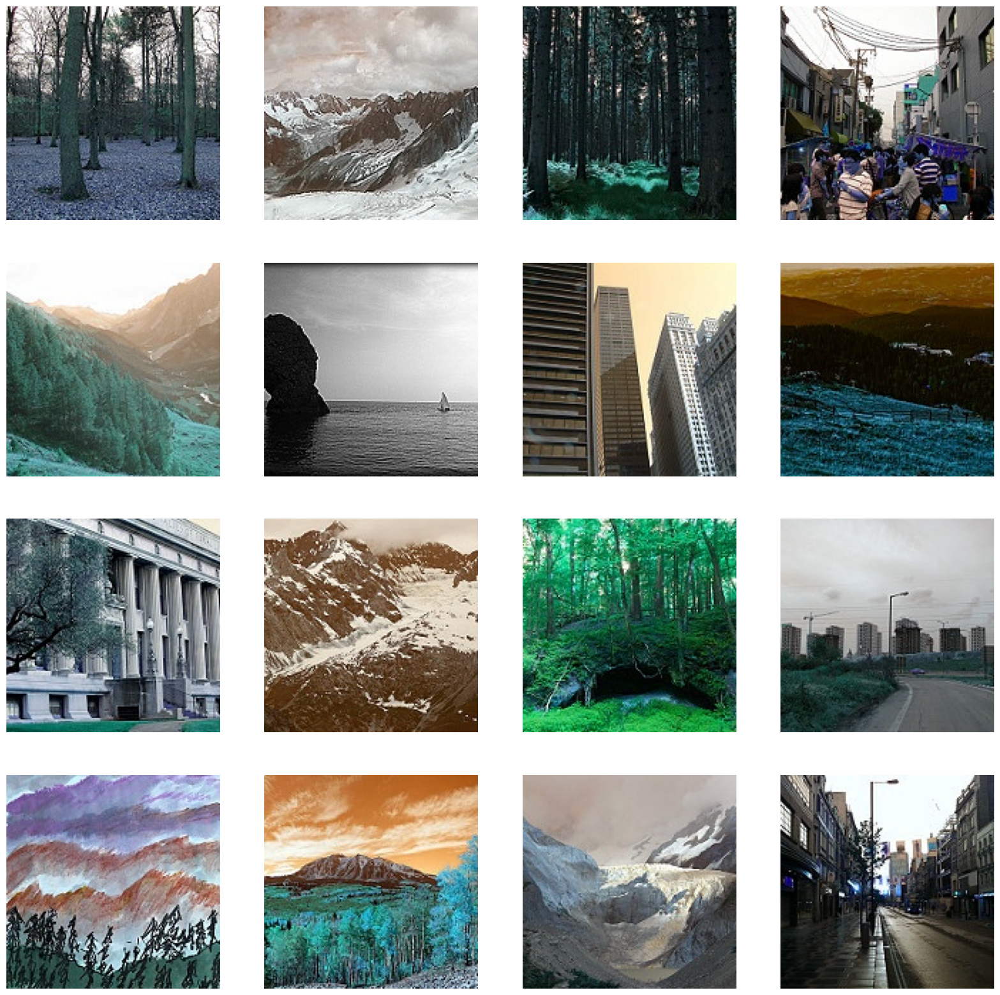

In [27]:
plt.figure(figsize=(20,20))
for n,i in enumerate(list(np.random.randint(0,len(x_pred),16))):
    plt.subplot(4,4,n+1)
    plt.imshow(x_pred[i])
    plt.axis('off')

Convert List to arrays

In [15]:
x_train=np.array(x_train)
x_test=np.array(x_test)
x_pred=np.array(x_pred)
y_train=np.array(y_train)
y_test=np.array(y_test)
print(f"x_train shape is {x_train.shape}\n"
      f"x_test shape is {x_test.shape}\n"
      f"x_pred shape is {x_pred.shape}\n"
      f"y_train shape is {y_train.shape}\n"
      f"y_test shape is {y_test.shape}")

x_train shape is (12767, 150, 150, 3)
x_test shape is (3000, 150, 150, 3)
x_pred shape is (7301, 150, 150, 3)
y_train shape is (12767,)
y_test shape is (3000,)


**Building Model**

In [16]:
model = keras.models.Sequential([
    keras.layers.Conv2D(256, kernel_size=(3, 3), activation='relu', input_shape=(150, 150, 3)),
    keras.layers.Conv2D(128, kernel_size=(3, 3), activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(3, 3),
    keras.layers.Conv2D(64, kernel_size=(3, 3), activation='relu'),
    keras.layers.Conv2D(32, kernel_size=(3, 3), activation='relu'),
    keras.layers.Conv2D(16, kernel_size=(3, 3), activation='relu'),
    keras.layers.BatchNormalization(),
    keras.layers.MaxPool2D(3, 3),

    keras.layers.Flatten(),  # Added Flatten layer here

    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(6, activation='softmax')
])

print(model.summary())

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 148, 148, 256)       │           7,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 146, 146, 128)       │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 146, 146, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 48, 48, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 46, 46, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 44, 44, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 42, 42, 16)          │           4,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 42, 42, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 14, 14, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 3136)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         401,536 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 6)                   │             198 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 811,734 (3.10 MB)

 Trainable params: 811,446 (3.10 MB)

 Non-trainable params: 288 (1.12 KB)

None


In [17]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model.fit(x_train, y_train, epochs = 25, batch_size=64, verbose=1)

Epoch 1/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 49s 111ms/step - accuracy: 0.5730 - loss: 1.1099
Epoch 2/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.7776 - loss: 0.6166
Epoch 3/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.8405 - loss: 0.4522
Epoch 4/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.8652 - loss: 0.3764
Epoch 5/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.8928 - loss: 0.2980
Epoch 6/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.9230 - loss: 0.2161
Epoch 7/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.9344 - loss: 0.1853
Epoch 8/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.9508 - loss: 0.1425
Epoch 9/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.9566 - loss: 0.1196
Epoch 10/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.9662 - loss: 0.0977
Epoch 11/25
200/200 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step - accuracy: 0.9821 - loss: 0.0548
Epoch 12/25
200/200 ━━━━━━━━━

**Model Evaluation**

In [19]:
loss, accuracy = model.evaluate(x_test, y_test)
print('Test Loss is {}'.format(loss))
print('Test Accuracy is {}'.format(accuracy ))

94/94 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.8130 - loss: 1.2397
Test Loss is 1.4557981491088867
Test Accuracy is 0.781000018119812


In [20]:
y_test_pred = model.predict(x_test)
print(f'Prediction Shape is {y_test_pred.shape}')

94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step
Prediction Shape is (3000, 6)


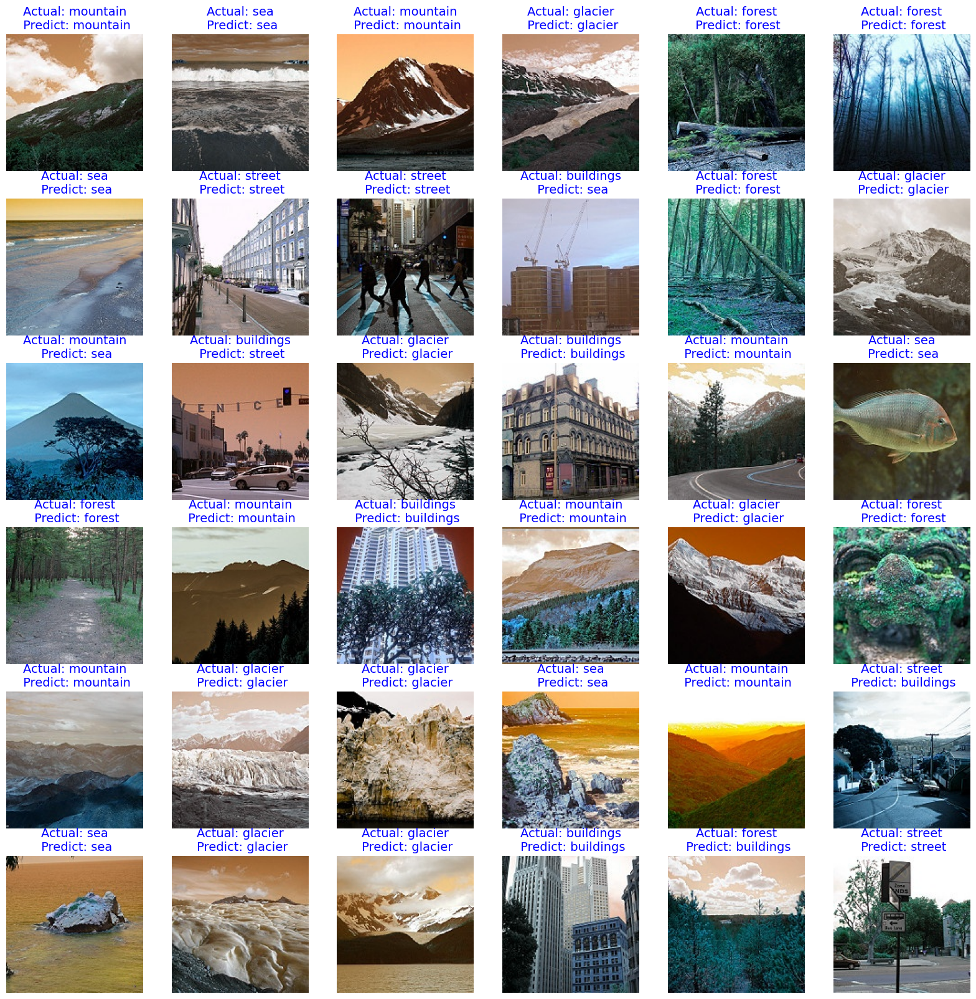

In [22]:
plt.figure(figsize = (20, 20))
for n, i in enumerate(list(np.random.randint(0, len(x_test), 36))):
    plt.subplot(6, 6, n+1)
    plt.imshow(x_test[i])
    plt.axis('off')
    plt.title(f'Actual: {getcode(y_test[i])}\n Predict: {getcode(np.argmax(y_test_pred[i]))}', fontdict = {'fontsize': 14, 'color': 'blue'})

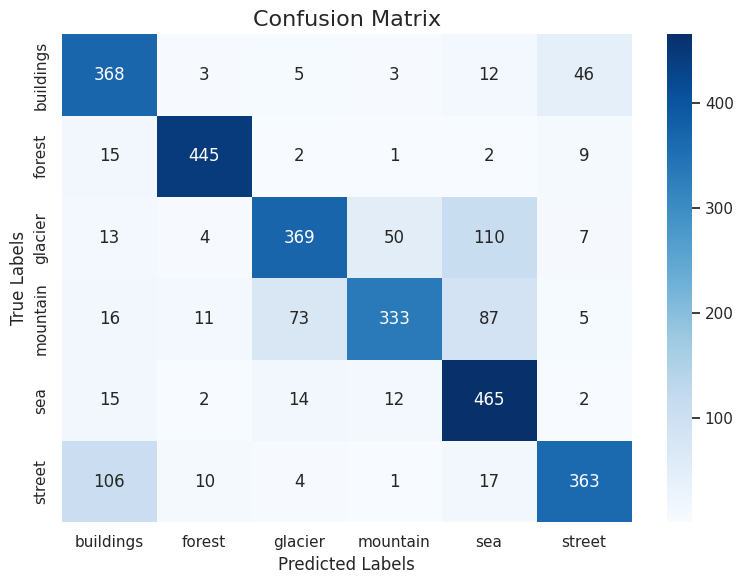

In [23]:
class_names = ['buildings','forest','glacier','mountain','sea','street']
pred_labels = np.argmax(y_test_pred, axis=1)

cm = confusion_matrix(y_test, pred_labels)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)

plt.title("Confusion Matrix", fontsize=16)
plt.xlabel("Predicted Labels", fontsize=12)
plt.ylabel("True Labels", fontsize=12)
plt.tight_layout()
plt.show()

Model performs well overall, but struggles to distinguish:
- Buildings from streets
- Mountains, glaciers, and sea from each other.

**Performance on prediction data**

229/229 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step


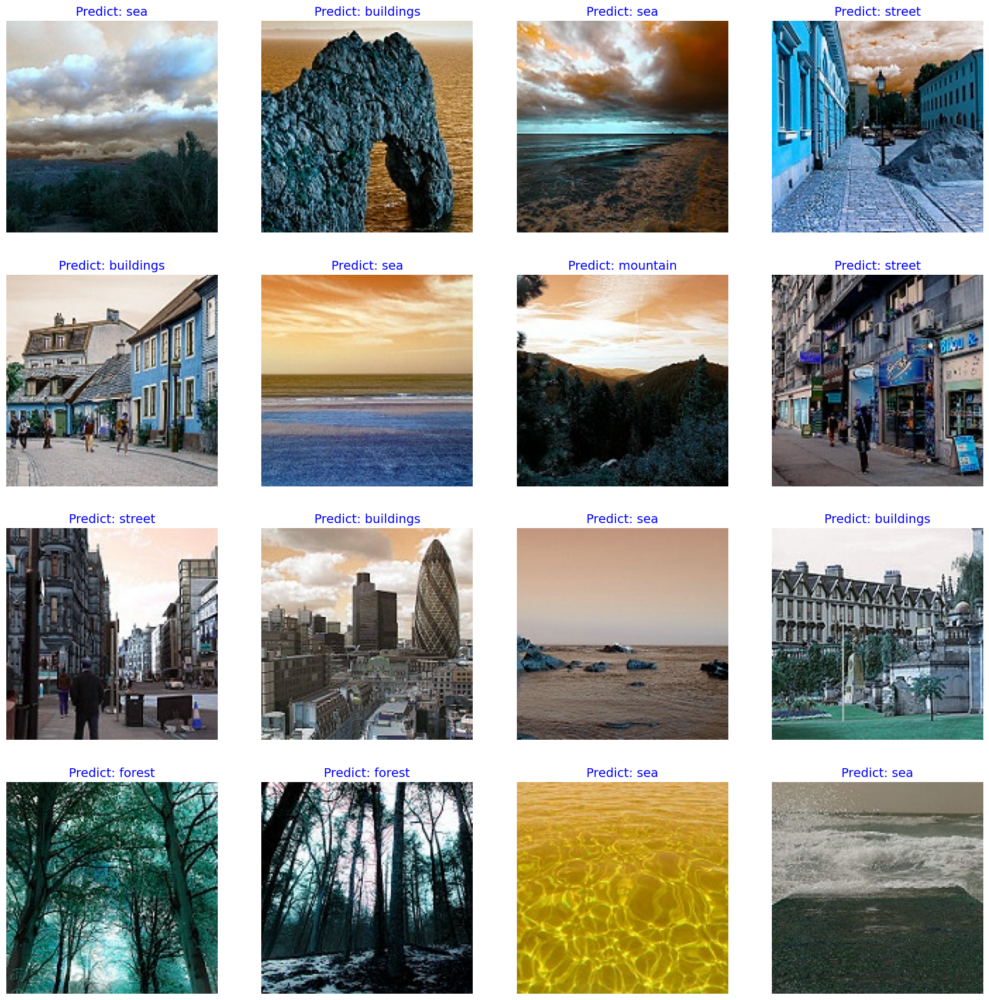

In [24]:
y_pred = model.predict(x_pred)
plt.figure(figsize = (20, 20))
for n, i in enumerate(list(np.random.randint(0, len(x_pred), 16))):
    plt.subplot(4, 4, n+1)
    plt.imshow(x_pred[i])
    plt.axis('off')
    plt.title(f'Predict: {getcode(np.argmax(y_pred[i]))}', fontdict = {'fontsize': 14, 'color': 'blue'})